# Bottlenecks, Hubs, Communities
## Measuring the Structure of a Graph

Graphs come in a multitude of different forms or structures. There are graphs with few connections per node (low average degree) such as networks based on high-school dating (most people date few others, see {cite}`bearman2004chains`) and those with many connections per node such as many social networks.

Moreover, there is a wide range of different metrics that are applied to measure important aspects or properties of a graph. Some of the most commonly used such measures will be introduced in this chapter.

### Average path length
The *average path length* indicates how far apart two nodes typically are. 
This is computed by taking the average over the shortest paths between all possible pairs of nodes in a (connected) graph:

$$
\langle \ell \rangle = \frac{\sum   _{i,j}\ell_{ij}}{N (N-1)}
$$
					
where $\ell_{ij}$ is the shortest path from $i$ to $j$.

Networks with many connections and hubs/centers usually have a small average path length, often termed "small world property". A typical example is the surprisingly low number of steps that is required (on average) to connect two random people via their social connections ("I know someone who knows someone who knows someone..."). 

**Warning:** This is a relatively straightforward measure for graphs of small to moderate sizes. But for very large graphs this can quickly become difficult to compute because the number of possible pairs of nodes grows with $n^2$, and the shortest path also becomes increasingly expensive to compute the larger the network becomes.

### Clustering Coefficient

The *Clustering Coefficient* indicates how well nodes are interconnected, i.e., how often neighbor nodes are also neighbors of each other ("A friend of a friend is a friend...").

Clustering coefficient:

$$
C(i) = \frac{\tau(i)}{\tau_{max}(i)} = \frac{2\tau(i)}{k_i(k_i-1)}
$$

$$
C= \frac{\sum_{i:k>1}C(i)}{N_{k>1   }}
$$

In the following we will see three randomly generated graphs which were displayed in a previous chapter as well. But now the average path length and the clustering coefficients will be displayed as well to give you a first intuition of what those properties actually measure.

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

# Import networkx
import networkx as nx

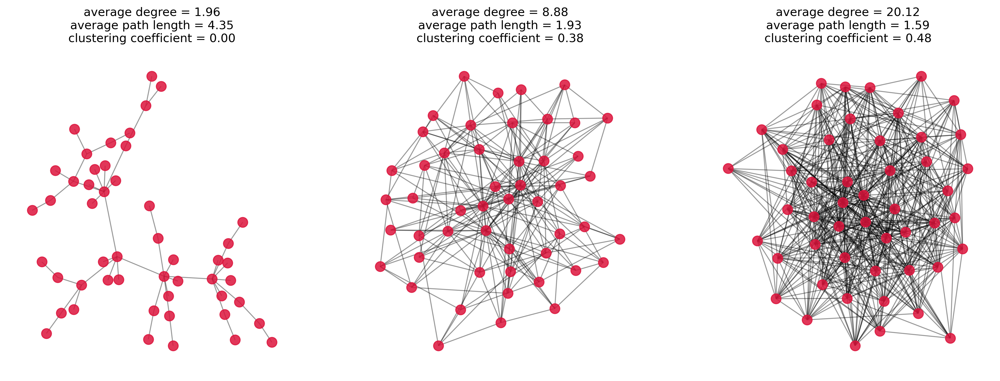

In [2]:
num_nodes = 50
plot_parameters = {"node_size": 100,
                   "node_color": "crimson",
                   "alpha": 0.85
                  }

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

# Function to plot the graph and display metrics
def plot_graph(ax, G):
    pos = nx.spring_layout(G, k=0.1, seed=0)
    nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax)
    nx.draw_networkx_nodes(G, pos, **plot_parameters, ax=ax)
    avg_degree = np.mean([x[1] for x in G.degree])
    avg_path_length = nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    clustering_coeff = nx.average_clustering(G)
    ax.set_title(f"average degree = {avg_degree:.2f}\n" +
                 f"average path length = {avg_path_length:.2f}\n" +
                 f"clustering coefficient = {clustering_coeff:.2f}")
    ax.axis('off')

# 1
G1 = nx.powerlaw_cluster_graph(num_nodes, 1, 0.2, seed=0)
plot_graph(ax1, G1)

# 2
G2 = nx.powerlaw_cluster_graph(num_nodes, 5, 0.2, seed=0)
plot_graph(ax2, G2)

# 3
G3 = nx.powerlaw_cluster_graph(num_nodes, 15, 0.2, seed=0)
plot_graph(ax3, G3)

plt.show()

## How important is a Node?

Often, we are interested in the importance of individual nodes. Which elements are essential for the network? What are potential bottlenecks? Who / What is best connected?

For this, there are several measuring methods, two of the most well-known are *closeness centrality* and *betweenness centrality*. The naming of these two terms is not ideal, at least we saw that it often is confusing to students at first. But let's try to understand both measures to learn what we can use them for.

### Closeness Centrality
The *closeness centrality* measures the average distance from a node to all other nodes. High closeness centrality means a small average distance (since the reciprocal is used in the formula), i.e., the nodes with the highest values are the "central" points of the network. It's the fastest to get anywhere from here. 

**Closeness centrality (for nodes)**:

$$
g_i =\frac{N - 1}{\sum  _{i\neq j}\ell_{ij}}
$$

with $\ell_{ij}$ being the shortest path from $i$ to $j$.

It is important to note, that the closeness centrality does not necessarily reflect what we intuitively mean by the "importance" of a node for the rest of the network. If you live in a tiny village that happens to be close to a major traffic hub, such as an international airport, this node (your village) would get a high closeness centrality because many other nodes are within short reach. The really important node, however, is the traffic hub itself and not your village (hope this doesn't hurt any feelings...).

### Betweenness Centrality
*Betweenness centrality* considers how many of all shortest paths pass through a certain node. In other words, how many shortest paths would be eliminated if a certain node were removed. Bottlenecks in the network, for instance, are characterized by high *betweenness centrality*. But also central hubs that facilitate many paths in the network will rank high.

**Betweenness centrality (for nodes)**

$$
b_i = \sum  _{h \neq j \neq i}\frac{\sigma(j, h |i)}{\sigma(j, h)}
$$

With $\sigma(j, h)$ the number of shortest paths from node $j$ to $h$ and $\sigma(j, h |i)$ the number of shortest paths from node $j$ to $h$ that pass through node $i$.

In [3]:
# generate a random network
G = nx.powerlaw_cluster_graph(100, 1, 0.5, seed=0)
pos = nx.spring_layout(G, k=0.05, seed=0)

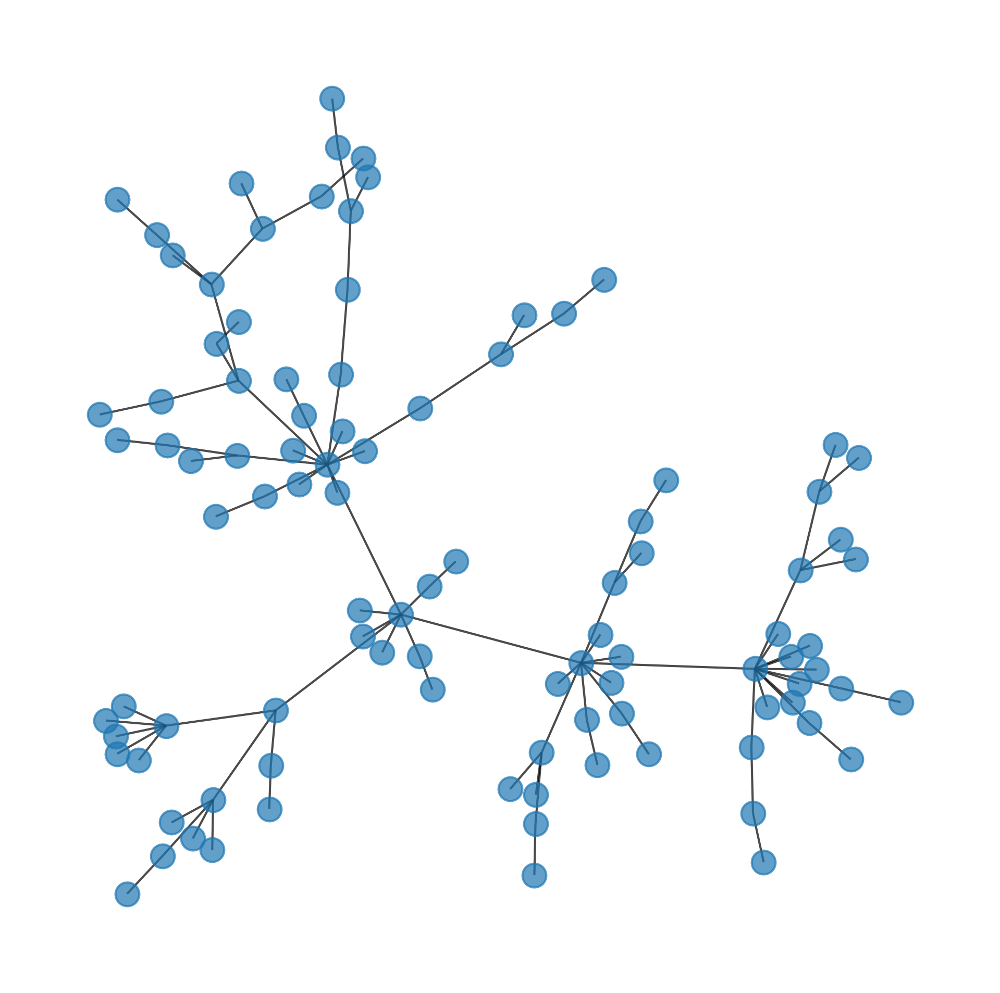

In [4]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
nx.draw(G,
        pos=pos,
        node_size=120,
        alpha=0.7,
        ax=ax,
       )

### What are the "most important" nodes?
Graphs often represent complex data containing a lot of information about relationships, flows, routes, etc.
...

We are often interested in measuring the "importance" of nodes. And importance can mean a lot of different things, depending on what my data is and what my precise question and interest is. 

closeness centrality

betweenness centrality

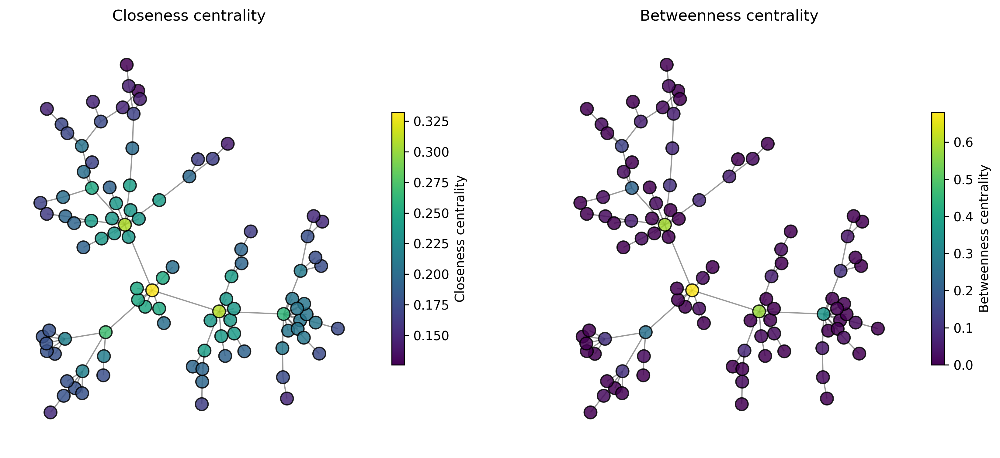

In [5]:
from matplotlib.cm import ScalarMappable


properties1 = dict(nx.closeness_centrality(G))
properties2 = dict(nx.betweenness_centrality(G))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

def plot_centrality(ax, title, properties, cmap="viridis"):
    """Plot network and color nodes by centralities-"""
    nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax)
    nx.draw_networkx_nodes(G, pos, nodelist=list(properties.keys()),
                           node_size=100,
                           node_color=list(properties.values()),
                           cmap=cmap,
                           alpha=0.85,
                           edgecolors="black",
                           ax=ax)
    ax.set_title(title)
    sm = ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(properties.values()), vmax=max(properties.values())))
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.6)
    cbar.set_label(title)
    ax.axis('off')

# Plot closeness centrality
plot_centrality(ax1, "Closeness centrality", properties1)

# Plot betweenness centrality
plot_centrality(ax2, "Betweenness centrality", properties2)

plt.show()

### How important is an edge?
*Betweenness centrality* can be calculated not only for nodes but also for edges. Analog to the case for nodes you can think of this as a question to how often a certain link is used when traversing the graph between two nodes. 

**Betweenness centrality (for edges)**

$$
b_e = \sum_{i, j}\frac{\sigma(i, j |e)}{\sigma(i,j)}
$$

With $\sigma(i, j)$ the number of shortest paths from node $i$ to $j$ and $\sigma(i, j |e)$ the number of shortest paths from node $i$ to $j$ that pass through edge $e$.

In the following graph figure the edges are colored and their width is scaled by the edge betweenness centrality. At least in this example this measure works very well to identify the most "important" connections if it commes to connecting different parts of the graph.

C:\Users\flori\AppData\Local\Temp\ipykernel_32280\1679172726.py:7: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edgelist=edges,


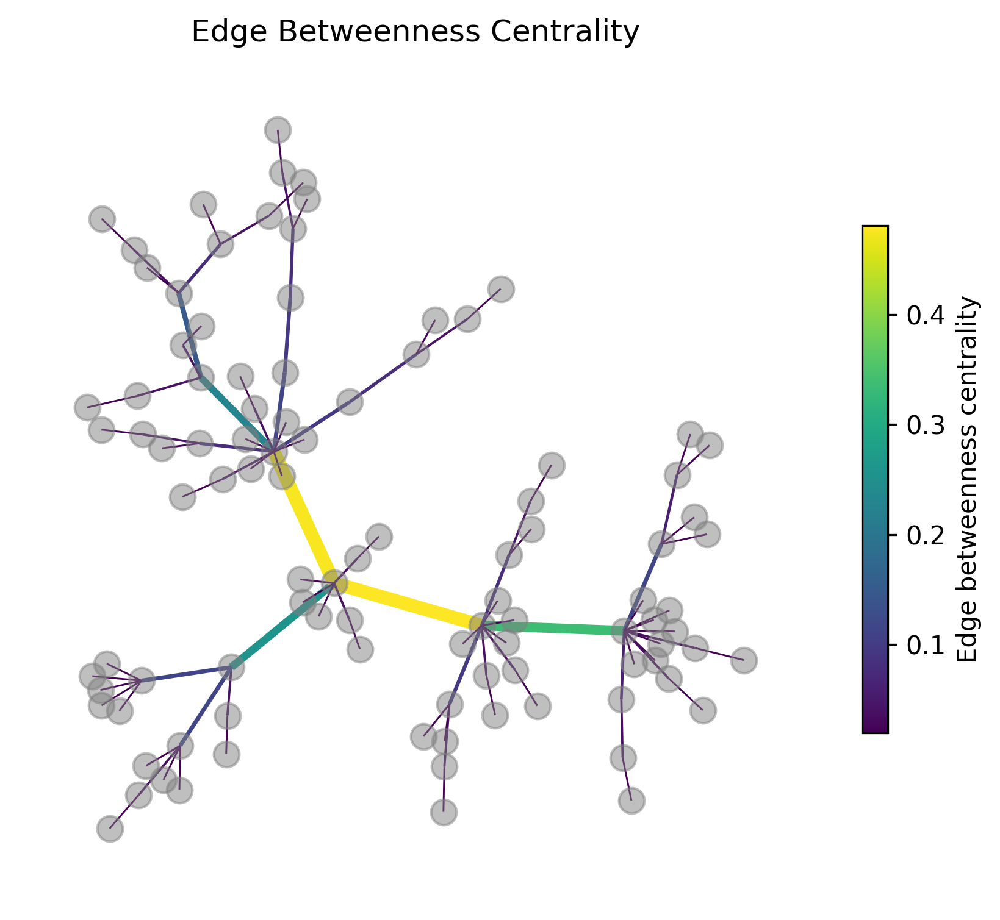

In [6]:
edge_betweenness = dict(nx.edge_betweenness_centrality(G))
edges, weights = zip(*edge_betweenness.items())

fig, ax = plt.subplots(figsize=(7, 6), dpi=300)
cmap="viridis"
nx.draw_networkx_nodes(G, pos, node_color="gray", node_size=100, alpha=0.5, ax=ax)
nx.draw_networkx_edges(G, pos, edgelist=edges,
                       width=0.5 + 10*np.array(weights),
                       edge_color=weights,
                       edge_cmap=plt.get_cmap(cmap), edge_vmin=min(weights),
                       edge_vmax=max(weights), alpha=1, ax=ax)
ax.set_title("Edge Betweenness Centrality")
sm1 = ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(edge_betweenness.values()),
                                                   vmax=max(edge_betweenness.values())))
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax, orientation='vertical', shrink=0.6)
cbar1.set_label("Edge betweenness centrality")

ax.axis('off')
plt.show()

## Communities (a.k.a. clusters)

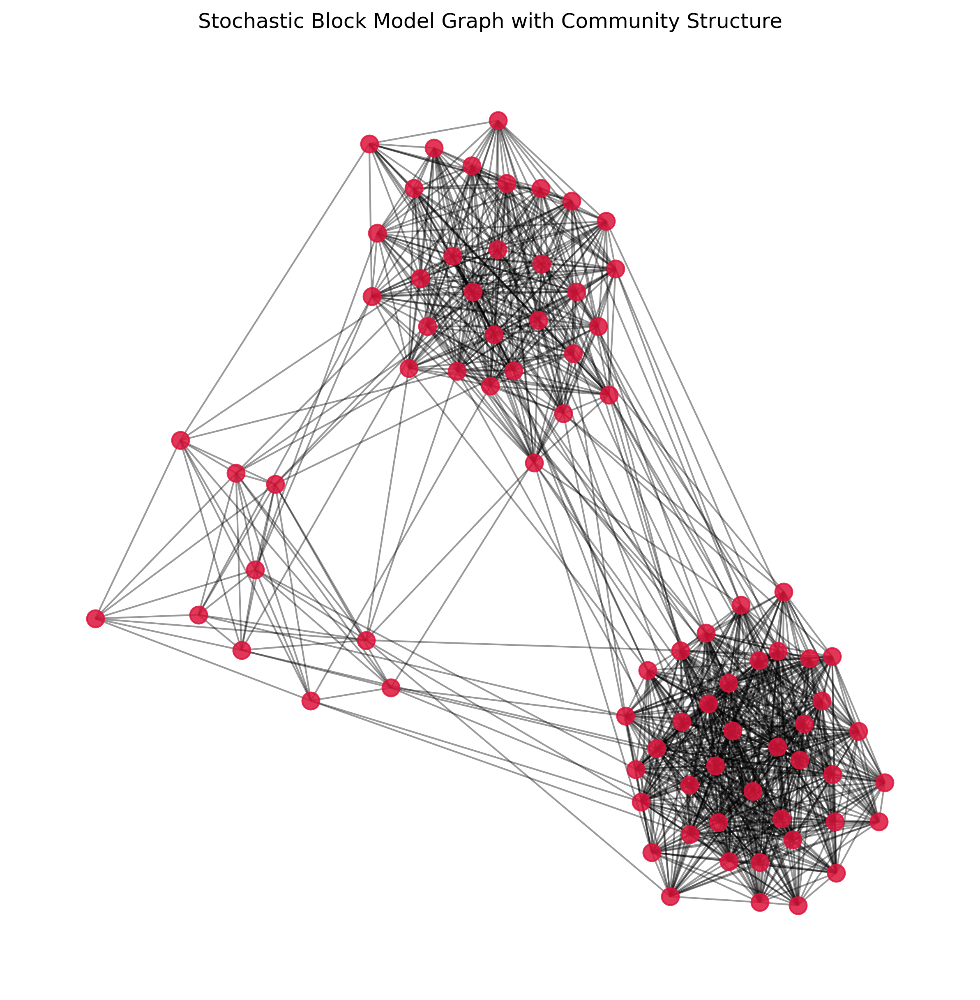

In [7]:
# Parameters for dummy data generation
sizes = [30, 10, 40]  # Sizes of each community
p_intra = 0.7  # Probability of edges within communities
p_inter = 0.03  # Probability of edges between communities

# Create a stochastic block model graph
probs = [[p_intra if i == j else p_inter for j in range(len(sizes))] for i in range(len(sizes))]
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Plot parameters
plot_parameters = {"node_size": 100,
                   "node_color": "crimson",
                   "alpha": 0.85
                  }

# Generate positions for visualization
pos = nx.spring_layout(G, seed=42)

# Plot the graph
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax)
nx.draw_networkx_nodes(G, pos, **plot_parameters, ax=ax)
plt.title("Stochastic Block Model Graph with Community Structure")
plt.axis('off')
plt.show()

In the above graph, most people will immediately "see" three different clusters (or, in network analysis language: communities). But how can we assign them automatically?

There are many different **community detection algorithms** for doing this job. And, just as we saw with clustering ({numref}`ch_clustering`), most such algorithms come with different advantages and disadvantages. And, again just like we saw in the clustering chapter, there often is not just one correction solution, because most cases are not as "clear" as the here depicted example.

But let's start with the simple example first.

### Girvan-Newman Algorithm

One of the well-known community detection algorithms is the Girvan-Newman algorithm. This method works by iteratively removing edges with the highest betweenness centrality. 

The basic idea is that edges connecting different communities will have high betweenness centrality because they act as bridges between clusters. By removing these edges, the graph will eventually break down into distinct communities. The algorithm continues this process, recalculating betweenness centrality at each step, until the desired number of communities is achieved. This approach is particularly effective for identifying community structures in networks where the communities are loosely connected. However, it can be computationally intensive for large graphs due to the need to repeatedly calculate betweenness centrality.

Today, this algorithm is mostly used for illustrative purposes. In practice, other algorithms often work more efficiently and more robustly.

Let us again look at the edge betweenness centralities of this graph:

C:\Users\flori\AppData\Local\Temp\ipykernel_32280\422447040.py:8: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edgelist=edges,


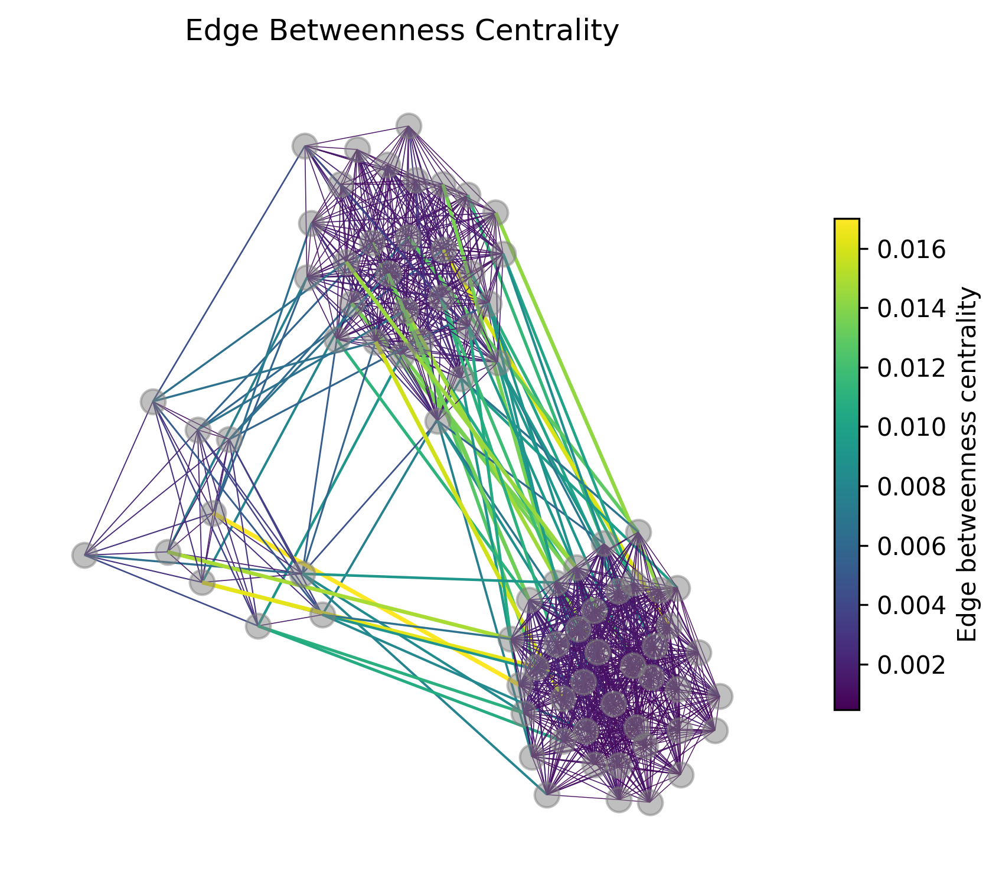

In [8]:
edge_betweenness = dict(nx.edge_betweenness_centrality(G))
edges, weights = zip(*edge_betweenness.items())
weights_normalized = np.array(weights) / max(weights)

fig, ax = plt.subplots(figsize=(7, 6), dpi=300)
cmap="viridis"
nx.draw_networkx_nodes(G, pos, node_color="gray", node_size=100, alpha=0.5, ax=ax)
nx.draw_networkx_edges(G, pos, edgelist=edges,
                       width=0.25 + 1.5 * weights_normalized,
                       edge_color=weights,
                       edge_cmap=plt.get_cmap(cmap), edge_vmin=min(weights),
                       edge_vmax=max(weights), alpha=1, ax=ax)
ax.set_title("Edge Betweenness Centrality")
sm1 = ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(edge_betweenness.values()),
                                                   vmax=max(edge_betweenness.values())))
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax, orientation='vertical', shrink=0.6)
cbar1.set_label("Edge betweenness centrality")

ax.axis('off')
plt.show()

We can see, that indeed, the highest edge betweenness centrality is assigned to edges connecting the different clusters. An important issue with Girvan-Newman, however, is that we have to define when to stop iteratively removing such edges.

In [9]:
communities_generator = nx.community.girvan_newman(G)
step1_communities = next(communities_generator)
step2_communities = next(communities_generator)

In [10]:
len(step1_communities), len(step2_communities)

(2, 3)

In [11]:
step3_communities = next(communities_generator)

In [12]:
# Create a mapping from node to community
node_community_map = {}
for i, community in enumerate(step3_communities):
    for node in community:
        node_community_map[node] = i

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


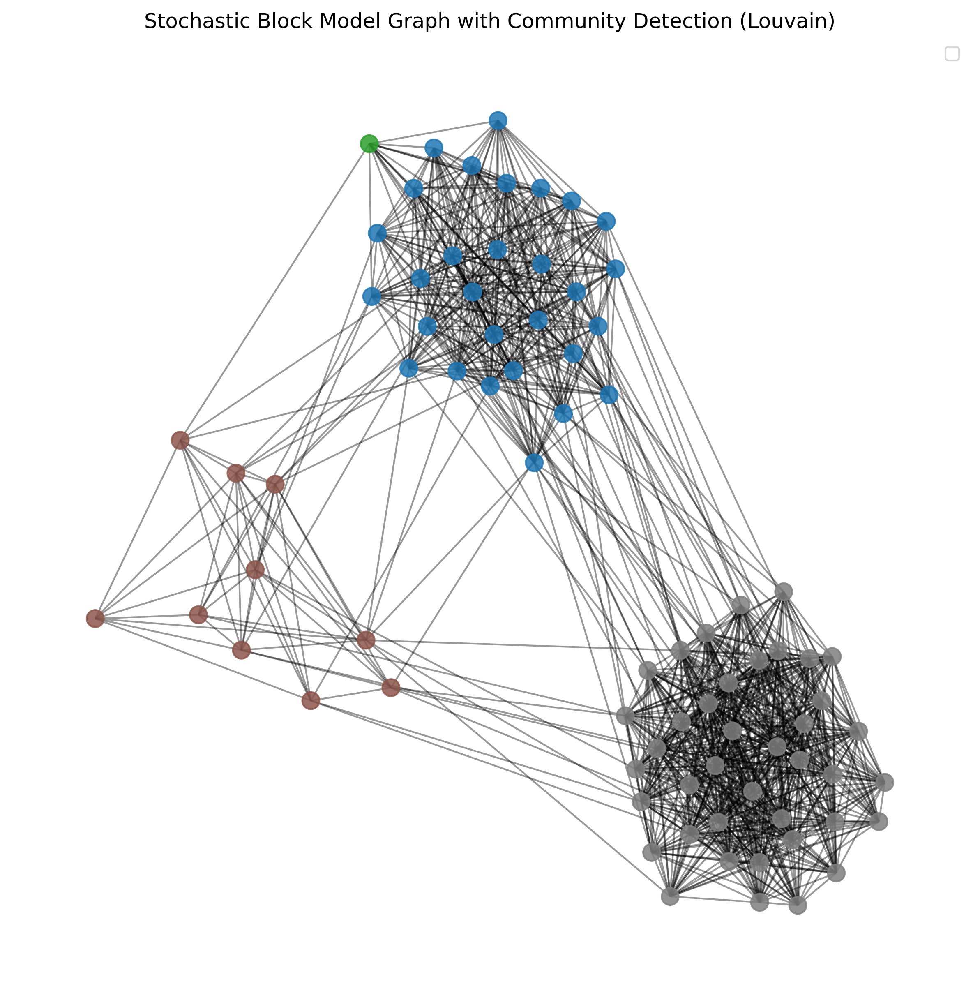

In [13]:
# Get unique communities and assign colors
num_communities = len(step3_communities)
colors = [plt.cm.tab10(i / float(num_communities)) for i in range(num_communities)]

# Assign colors to nodes based on community
node_colors = [colors[node_community_map[node]] for node in G.nodes()]

# Plot parameters
plot_parameters = {"node_size": 100,
                   "node_color": node_colors,
                   "alpha": 0.85
                  }

# Generate positions for visualization
pos = nx.spring_layout(G, seed=42)

# Plot the graph
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax)
nx.draw_networkx_nodes(G, pos, **plot_parameters, ax=ax)
plt.title("Stochastic Block Model Graph with Community Detection (Louvain)")
plt.axis('off')
plt.legend()
plt.show()

### Evaluating Community Structure - Modularity

The above example using the Girvan-Newman is not very convincing once we break the graph into smaller and smaller communities. But how can we actually *measure* the quality of our community detection? One of the most widely used measures for this purpose is **modularity**. Modularity quantifies the strength of the division of a network into communities. It compares the density of edges inside communities with the density of edges between communities.

Mathematically, modularity is defined as:

$$
Q = \frac{1}{2m} \sum_{ij} \left[ A_{ij} - \frac{k_i k_j}{2m} \right] \delta(c_i, c_j)
$$

where:

- $A_{ij}$​ is the adjacency matrix of the network (1 if there is an edge between node $i$ and node $j$, 0 otherwise).
- $k_i$​ and $k_j$​ are the degrees of nodes $i$ and $j$, respectively.
- $m$ is the total number of edges in the network.
- $\delta(c_i, c_j)$ is 1 if nodes $i$ and $j$ are in the same community, 0 otherwise.

The value of modularity ranges from -1 to 1. Higher values indicate a stronger community structure, meaning that there are more edges within communities and fewer edges between communities than expected by chance. A modularity value close to 0 suggests that the detected communities are no better than random groupings, while negative values indicate that the detected structure is worse than random.

By using modularity, we can objectively assess the quality of the community structure detected by various algorithms, helping us determine which method or parameters yield the best partitioning of the network.

### Louvain algorithm
A very popular method for community detection is the **Louvain algorithm** {cite}`blondel2008fast`. This algorithm is designed to uncover communities in large networks quickly and efficiently. It works in two main phases:

1. **Modularity Optimization**: Initially, each node is assigned to its own community. The algorithm then repeatedly moves individual nodes to neighboring communities in a way that maximizes the increase in modularity, a measure that quantifies the density of links inside communities compared to links between communities.

2. **Community Aggregation**: After modularity cannot be increased further, the algorithm aggregates nodes belonging to the same community and builds a new network where each community is treated as a single node. The process of modularity optimization is then repeated on this new, smaller network.

The Louvain algorithm iterates between these two phases until no further modularity improvements can be made. This method is highly efficient and can handle very large networks, making it widely used in practical applications. It effectively balances accuracy with computational complexity, allowing for the detection of high-quality community structures in a reasonable amount of time.

In [14]:
import networkx.algorithms.community as nx_comm

partitions_louvain = nx_comm.louvain_communities(G, seed=0)

In [15]:
len(partitions_louvain)

3

In [16]:
# Create a mapping from node to community
node_community_map = {}
for i, community in enumerate(partitions_louvain):
    for node in community:
        node_community_map[node] = i

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


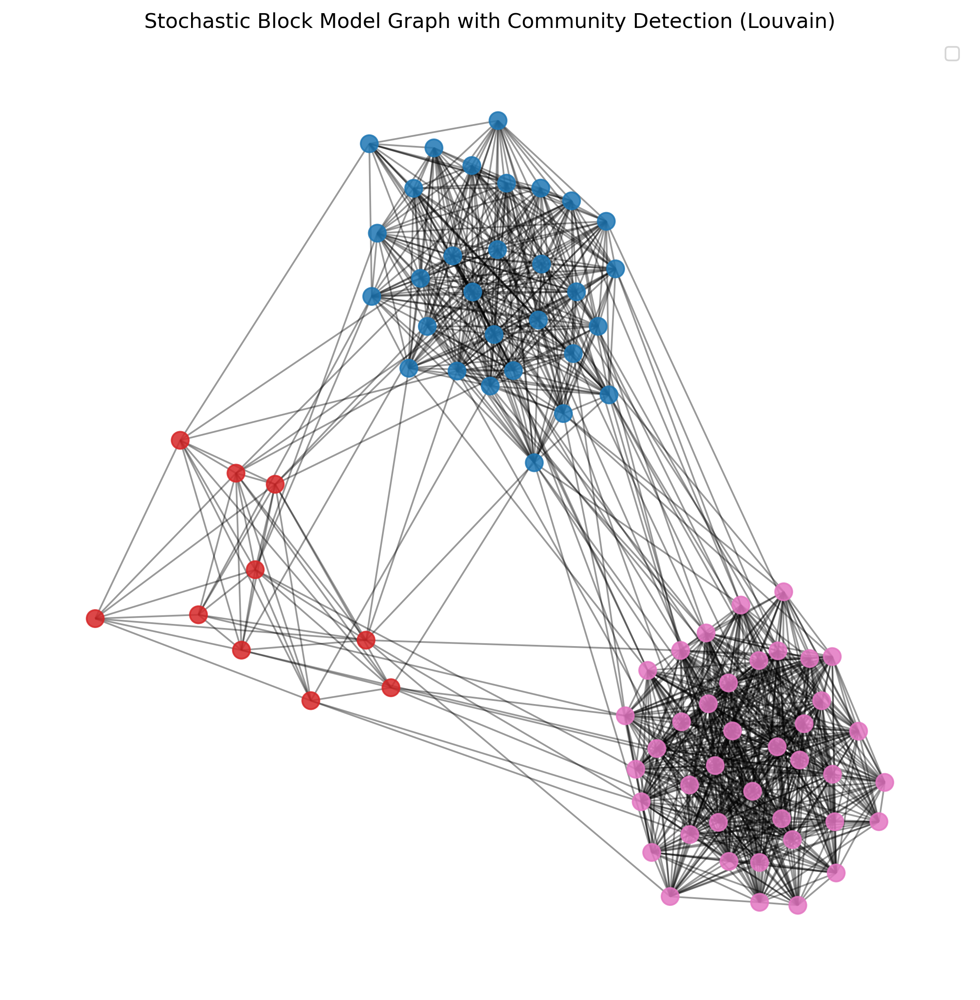

In [17]:
# Get unique communities and assign colors
num_communities = len(partitions_louvain)
colors = [plt.cm.tab10(i / float(num_communities)) for i in range(num_communities)]

# Assign colors to nodes based on community
node_colors = [colors[node_community_map[node]] for node in G.nodes()]

# Plot parameters
plot_parameters = {"node_size": 100,
                   "node_color": node_colors,
                   "alpha": 0.85
                  }

# Generate positions for visualization
pos = nx.spring_layout(G, seed=42)

# Plot the graph
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax)
nx.draw_networkx_nodes(G, pos, **plot_parameters, ax=ax)
plt.title("Stochastic Block Model Graph with Community Detection (Louvain)")
plt.axis('off')
plt.legend()
plt.show()

Finally, let's see how this works for less obvious community structures:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


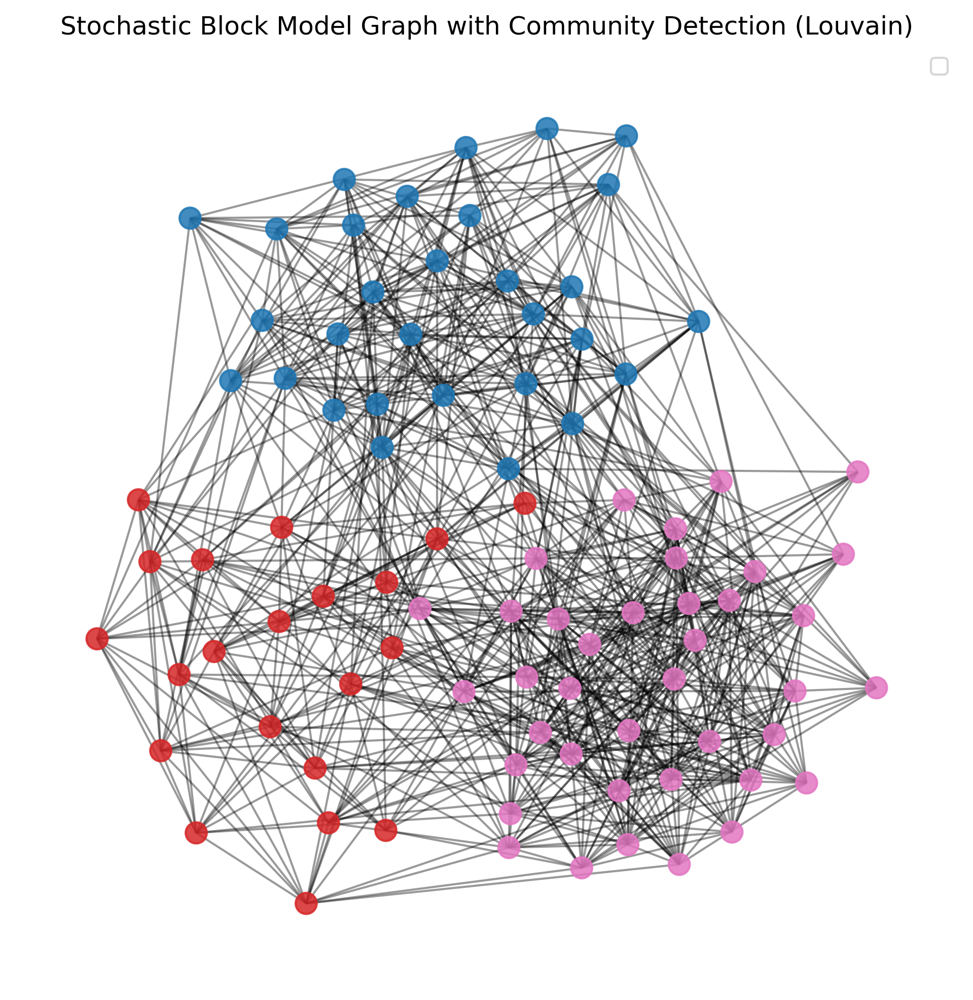

In [19]:
# Parameters for dummy data generation
sizes = [30, 20, 40]  # Sizes of each community
p_intra = 0.4  # Probability of edges within communities
p_inter = 0.07  # Probability of edges between communities

# Create a stochastic block model graph
probs = [[p_intra if i == j else p_inter for j in range(len(sizes))] for i in range(len(sizes))]
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Again, let's apply Louvain
partitions_louvain = nx_comm.louvain_communities(G, seed=0)

# Create a mapping from node to community
node_community_map = {}
for i, community in enumerate(partitions_louvain):
    for node in community:
        node_community_map[node] = i

# Get unique communities and assign colors
num_communities = len(partitions_louvain)
colors = [plt.cm.tab10(i / float(num_communities)) for i in range(num_communities)]

# Assign colors to nodes based on community
node_colors = [colors[node_community_map[node]] for node in G.nodes()]

# Plot parameters
plot_parameters = {"node_size": 100,
                   "node_color": node_colors,
                   "alpha": 0.85
                  }

# Generate positions for visualization
pos = nx.spring_layout(G, seed=42)

# Plot the graph
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax)
nx.draw_networkx_nodes(G, pos, **plot_parameters, ax=ax)
plt.title("Stochastic Block Model Graph with Community Detection (Louvain)")
plt.axis('off')
plt.legend()
plt.show()

## More on Networks

- A great introduction to the topic of networks and network analysis is the book "A first course in network science" {cite}`menczer2020first`.

- Much more on community detection can be found in:
{cite}`fortunato2010community, peixoto2023descriptive`

- Do you need some network datasets to play with? Try the [Stanford Large Network Dataset Collection](https://snap.stanford.edu/data/).